In [1]:
#Importing packages
import numpy as np
import pandas as pd
import seaborn as sns

import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

#Setting view option
pd.set_option('display.max_rows',None)

In [2]:
#Reading data
movie_raw = pd.read_csv('movies.csv')

# Data Cleaning

In [3]:
##Checking for nulls

for col in movie_raw.columns:
    pct_missing = np.mean(movie_raw[col].isnull())*100
    print(f'{col} - {pct_missing}%')


name - 0.0%
rating - 1.004173187271779%
genre - 0.0%
year - 0.0%
released - 0.02608242044861763%
score - 0.03912363067292645%
votes - 0.03912363067292645%
director - 0.0%
writer - 0.03912363067292645%
star - 0.013041210224308816%
country - 0.03912363067292645%
budget - 28.31246739697444%
gross - 2.464788732394366%
company - 0.2217005738132499%
runtime - 0.05216484089723526%


In [4]:
movie_df = movie_raw.dropna()
movie_df = movie_df.drop_duplicates()

In [5]:
movie_df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [6]:
#Correcting year of release using release date
movie_df['year_updated'] = movie_df['released'].astype(str).str[:4]

In [7]:
movie_df.sort_values(by=['gross'],inplace = False, ascending = False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year_updated
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000.0,2.847246e+09,Twentieth Century Fox,162.0,Dece
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000.0,2.797501e+09,Marvel Studios,181.0,Apri
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000.0,2.201647e+09,Twentieth Century Fox,194.0,Dece
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000.0,2.069522e+09,Lucasfilm,138.0,Dece
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000.0,2.048360e+09,Marvel Studios,149.0,Apri
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000.0,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000.0,1.670728e+09,Walt Disney Pictures,118.0,July
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000.0,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000.0,1.670516e+09,Universal Pictures,124.0,June
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000.0,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000.0,1.518816e+09,Marvel Studios,143.0,May
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000.0,James Wan,Chris Morgan,Vin Diesel,United States,190000000.0,1.515341e+09,Universal Pictures,137.0,Apri
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000.0,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000.0,1.450027e+09,Walt Disney Animation Studios,103.0,Nove


In [8]:
movie_df['ROI'] =((movie_df['gross'] - movie_df['budget'])/movie_df['budget'])

In [9]:
movie_df.sort_values(by=['ROI'],inplace = False, ascending = False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year_updated,ROI
5114,Paranormal Activity,R,Horror,2007,"October 16, 2009 (United States)",6.3,225000.0,Oren Peli,Oren Peli,Katie Featherston,United States,15000.0,1.933558e+08,Solana Films,86.0,Octo,12889.386667
3459,The Blair Witch Project,R,Horror,1999,"July 30, 1999 (United States)",6.5,239000.0,Daniel Myrick,Daniel Myrick,Heather Donahue,United States,60000.0,2.486391e+08,Haxan Films,81.0,July,4142.984983
6815,The Gallows,R,Horror,2015,"July 10, 2015 (United States)",4.3,20000.0,Travis Cluff,Chris Lofing,Reese Mishler,United States,100000.0,4.296441e+07,New Line Cinema,81.0,July,428.644100
2093,El Mariachi,R,Action,1992,"February 26, 1993 (United States)",6.9,64000.0,Robert Rodriguez,Robert Rodriguez,Carlos Gallardo,Mexico,7000.0,2.040920e+06,Columbia Pictures,81.0,Febr,290.560000
5154,Once,R,Drama,2007,"June 15, 2007 (United States)",7.8,112000.0,John Carney,John Carney,Glen Hansard,Ireland,150000.0,2.093672e+07,Bórd Scannán na hÉireann,86.0,June,138.578147
2467,Clerks,R,Comedy,1994,"November 9, 1994 (France)",7.7,214000.0,Kevin Smith,Kevin Smith,Brian O'Halloran,United States,27000.0,3.151130e+06,View Askew Productions,92.0,Nove,115.708519
4471,Napoleon Dynamite,PG,Comedy,2004,"August 27, 2004 (United States)",6.9,204000.0,Jared Hess,Jared Hess,Jon Heder,United States,400000.0,4.613889e+07,Fox Searchlight Pictures,96.0,Augu,114.347217
3233,In the Company of Men,R,Comedy,1997,"August 1, 1997 (United States)",7.2,13000.0,Neil LaBute,Neil LaBute,Aaron Eckhart,Canada,25000.0,2.804473e+06,Alliance Atlantis Communications,97.0,Augu,111.178920
4814,Keeping Mum,R,Comedy,2005,"October 6, 2006 (United States)",6.8,34000.0,Niall Johnson,Richard Russo,Rowan Atkinson,United Kingdom,169000.0,1.858683e+07,Summit Entertainment,99.0,Octo,108.981266
4304,Open Water,R,Adventure,2003,"August 20, 2004 (United States)",5.7,52000.0,Chris Kentis,Chris Kentis,Blanchard Ryan,United States,500000.0,5.468349e+07,Plunge Pictures LLC,79.0,Augu,108.366974


In [10]:
#sns.boxplot(data = movie_df, x='company', y='ROI')

Text(0, 0.5, 'gross')

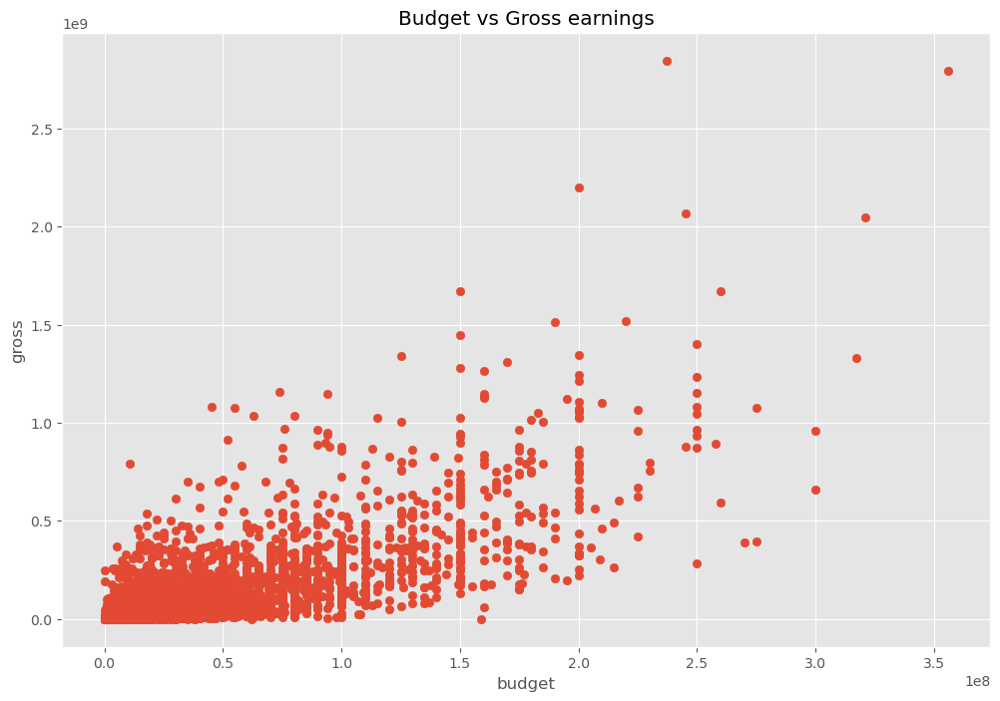

In [14]:
#Visual for hypothesis of correlation between budget and gross
plt.scatter(x=movie_df['budget'], y=movie_df['gross'])
plt.title('Budget vs Gross earnings')
plt.xlabel('budget')
plt.ylabel('gross')

<Axes: xlabel='budget', ylabel='gross'>

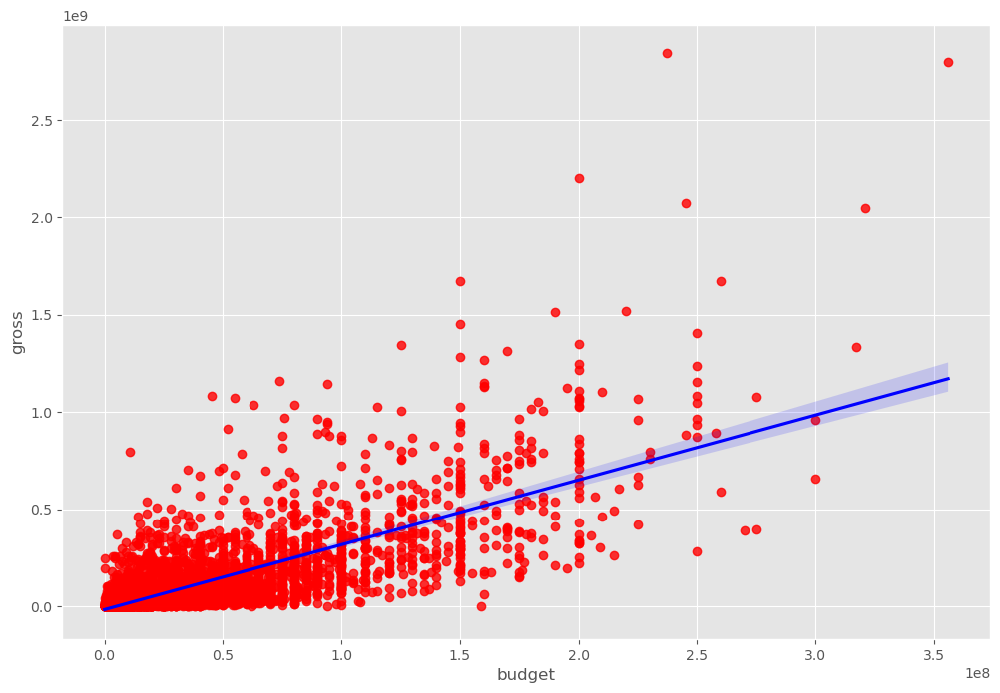

In [18]:
#Using seaborn 

sns. regplot(x='budget', y='gross', data=movie_df, scatter_kws={"color":"red"},line_kws={"color":"blue"})

In [23]:
#Pearson correlation
movie_df[['budget','gross','score','runtime']].corr()

,budget,gross,score,runtime
budget,1.000000,0.740247,0.072001,0.318695
gross,0.740247,1.000000,0.222556,0.275796
score,0.072001,0.222556,1.000000,0.414068
runtime,0.318695,0.275796,0.414068,1.000000


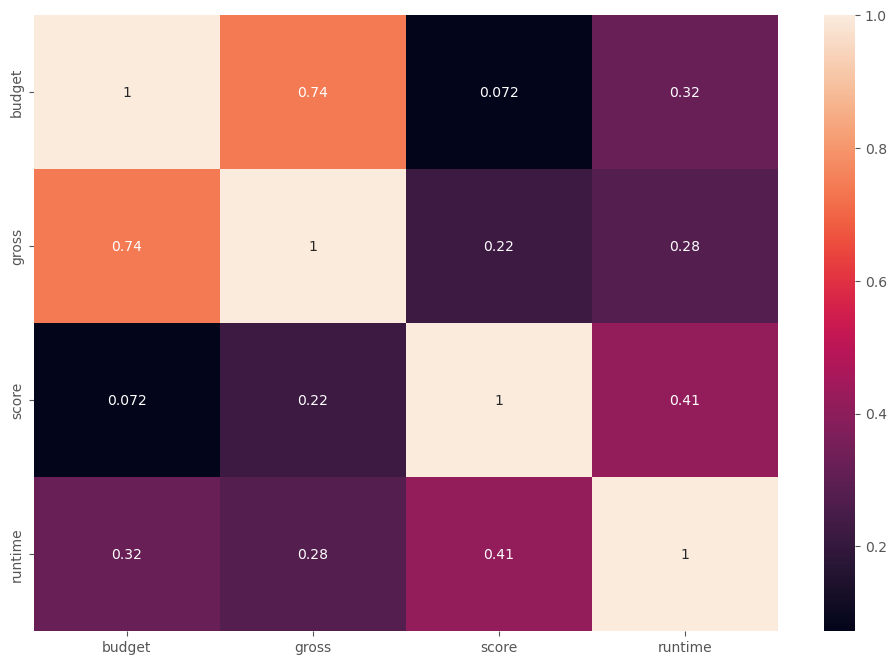

In [24]:
correlation_matrix = movie_df[['budget','gross','score','runtime']].corr()

sns.heatmap(correlation_matrix, annot = True)

plt.show()